# SPH in Beltrami force field

In this tutorial, you will set up and run a pressure-less SPH example in Struphy, then inspect particle evolution with simple diagnostics.

This notebook focuses on pressure-less flow in a Beltrami force field (model `PressureLessSPH`). If you want to start from template parameter files, generate them from the command line:

```
struphy params PressureLessSPH
```

The notebook keeps everything in Python so you can adjust parameters interactively and rerun sections quickly.

## Pressure-Less Flow in a Beltrami Force Field

We begin with a particle system in a 3D box domain $\Omega \subset \mathbb{R}^3$.

Given an initial velocity field $\mathbf{u}_0(\mathbf{x})$, we seek trajectories $(\mathbf{x}_p, \mathbf{v}_p)$ for particles $p=0,\dots,N-1$ satisfying

$$
\begin{aligned}
 \dot{\mathbf x}_p &= \mathbf v_p\,,\qquad && \mathbf x_p(0) = \mathbf x_{p0}\,,
 \\[2mm]
 \dot{\mathbf v}_p &= -\nabla p(\mathbf x_p)\,,\qquad && \mathbf v_p(0) = \mathbf u_0(\mathbf x_p(0))\,.
\end{aligned}
$$

Here, $p \in H^1(\Omega)$ is a prescribed scalar field. In this example, we choose $p$ so that the force field has Beltrami structure.

In practice, the workflow is: import APIs, define geometry and time stepping, set marker loading, configure propagators, run, and visualize.

First, import the Struphy components used throughout this tutorial.

In [1]:
from struphy import EnvironmentOptions, Time
from struphy import domains
from struphy import equils
from struphy import grids
from struphy import DerhamOptions
from struphy import (
    BoundaryParameters,
    LoadingParameters,
    WeightsParameters,
    SortingParameters,
    SavingParameters,
)
from struphy import Simulation

### Step 1: Create Environment, Time Integrator, and Domain

Set up a Cartesian (cuboid) domain and use Strang splitting for time integration. These choices define the simulation skeleton before any particle data are attached.

In [2]:
# environment options
env = EnvironmentOptions()

# time stepping
time_opts = Time(dt=0.004, Tend=10, split_algo="Strang")

# geometry
l1 = -0.5
r1 = 0.5
l2 = -0.5
r2 = 0.5
l3 = 0.0
r3 = 1.0
domain = domains.Cuboid(l1=l1, r1=r1, l2=l2, r2=r2, l3=l3, r3=r3)

### Step 2: Define the Beltrami Background

Next, define velocity, pressure, and density functions for the background equilibrium. We pass these to `GenericCartesianFluidEquilibrium`, which will later be used to initialize the particle state.

In [3]:
# construct Beltrami flow
import numpy as np

def u_fun(x, y, z):
    ux = -np.cos(np.pi * x) * np.sin(np.pi * y)
    uy = np.sin(np.pi * x) * np.cos(np.pi * y)
    uz = 0 * x
    return ux, uy, uz

p_fun = lambda x, y, z: 0.5 * (np.sin(np.pi * x) ** 2 + np.sin(np.pi * y) ** 2)
n_fun = lambda x, y, z: 1.0 + 0 * x

# put the functions in a generic equilibrium container
bel_flow = equils.GenericCartesianFluidEquilibrium(u_xyz=u_fun, p_xyz=p_fun, n_xyz=n_fun)

### Step 3: Choose Grid and de Rham Options

Even for particle-based dynamics, Struphy uses spline-based projections for some fields. Here we define a tensor-product grid and matching de Rham settings.

In [4]:
# fluid equilibrium (can be used as part of initial conditions)
equil = None

# grid
grid = grids.TensorProductGrid(num_elements=(64, 64, 1))

# derham options
bcs = (("free", "free"), ("free", "free"), None)
derham_opts = DerhamOptions(degree=(3, 3, 1), bcs=bcs)

### Step 4: Instantiate the `PressureLessSPH` Simulation

Create a lightweight model instance and combine it with the environment, domain, and discretization settings from the previous steps.

In [5]:
# import model
from struphy.models import PressureLessSPH

# light-weight model instance
model = PressureLessSPH(epsilon=1.0)

sim = Simulation(model,
                 env=env,
                 time_opts=time_opts,
                 domain=domain,
                 equil=equil,
                 grid=grid,
                 derham_opts=derham_opts,)

/home/rasaadmin/git_repos/struphy/src/struphy/models/species.py:198: UserWarning: Override equation parameter self.epsilon =1.0
  warnings.warn(f"Override equation parameter {self.epsilon =}")


### Step 5: Configure Marker Loading and Saving

Now set particle-marker parameters. In this example we:

- load `Np=1000` particles
- keep default weight construction
- apply reflective boundaries in $x,y$ and periodic in $z$
- save all markers via `n_markers=1.0`

We also keep sorting simple with one box per direction for this first run.

In [ ]:
loading_params = LoadingParameters(Np=100)
weights_params = WeightsParameters()
boundary_params = BoundaryParameters(bc=("reflect", "reflect", "periodic"))
sorting_params = SortingParameters(boxes_per_dim=(1, 1, 1))
saving_params = SavingParameters(n_markers=1.0)

model.cold_fluid.set_markers(
    loading_params=loading_params,
    weights_params=weights_params,
    boundary_params=boundary_params,
    sorting_params=sorting_params,
    saving_params=saving_params
)

### Step 6: Set Propagator Options

Configure the particle pushers. The key detail is to pass the Beltrami pressure potential to `push_v`, so the velocity update uses the intended force field.

In [7]:
# propagator options
from struphy import ButcherTableau

butcher = ButcherTableau(algo="forward_euler")
model.propagators.push_eta.options = model.propagators.push_eta.Options(butcher=butcher)

phi = bel_flow.p0
model.propagators.push_v.phi = phi

### Step 7: Apply Initial Conditions

Attach the Beltrami equilibrium as the background state for the cold fluid species. No additional perturbation is added in this tutorial run.

In [8]:
# background, perturbations and initial conditions
model.cold_fluid.var.add_background(bel_flow)

### Step 8: Run, Post-Process, and Visualize

Execute the simulation pipeline in order:

1. `run()` to advance particles in time
2. `pproc()` to build post-processed outputs
3. `load_plotting_data()` to bring diagnostics into memory

Then plot marker trajectories to inspect how the Beltrami-driven flow evolves.

In [9]:
sim.run()


Starting run for model PressureLessSPH ...
Time stepping: 100%|██████████| 2500/2500 [00:46<00:00, 54.11step/s]
Struphy run finished.


In [10]:
sim.pproc()


Post-processing path /home/rasaadmin/git_repos/struphy/tutorials/sim_1

No feec fields found in hdf5 file, skipping post-processing of fields.
Evaluation of 5000 marker orbits for cold_fluid
100%|██████████| 2501/2501 [00:43<00:00, 57.46it/s]


In [11]:
sim.load_plotting_data()


Loading post-processed plotting data:
Data path: /home/rasaadmin/git_repos/struphy/tutorials/sim_1/post_processing

The following data has been loaded:

grids:
self.t_grid.shape =(2501,)

self.spline_values:

self.orbits:
    cold_fluid, shape = (2501, 5000, 8)
        Number of time points: 2501
        Number of particles:   5000
        Number of attributes:  8

self.f:

self.n_sph:



i=0
i=125
i=250
i=375
i=500
i=625
i=750
i=875
i=1000
i=1125


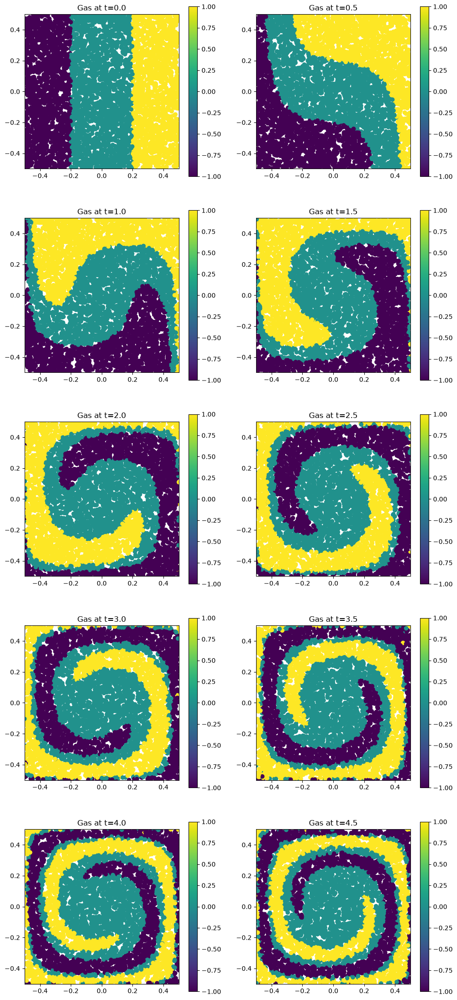

In [12]:
from matplotlib import pyplot as plt

plt.figure(figsize=(12, 28))

orbits = sim.orbits.cold_fluid

coloring = np.select(
    [orbits[0, :, 0] <= -0.2, np.abs(orbits[0, :, 0]) < +0.2, orbits[0, :, 0] >= 0.2], [-1.0, 0.0, +1.0]
)

dt = time_opts.dt
Nt = sim.t_grid.size - 1
interval = Nt / 20
plot_ct = 0
for i in range(Nt):
    if i % interval == 0:
        print(f"{i=}")
        plot_ct += 1
        plt.subplot(5, 2, plot_ct)
        ax = plt.gca()
        plt.scatter(orbits[i, :, 0], orbits[i, :, 1], c=coloring)
        plt.axis("square")
        plt.title("n0_scatter")
        plt.xlim(l1, r1)
        plt.ylim(l2, r2)
        plt.colorbar()
        plt.title(f"Gas at t={i * dt}")
    if plot_ct == 10:
        break

i=0
i=125
i=250
i=375
i=500
i=625
i=750
i=875
i=1000
i=1125


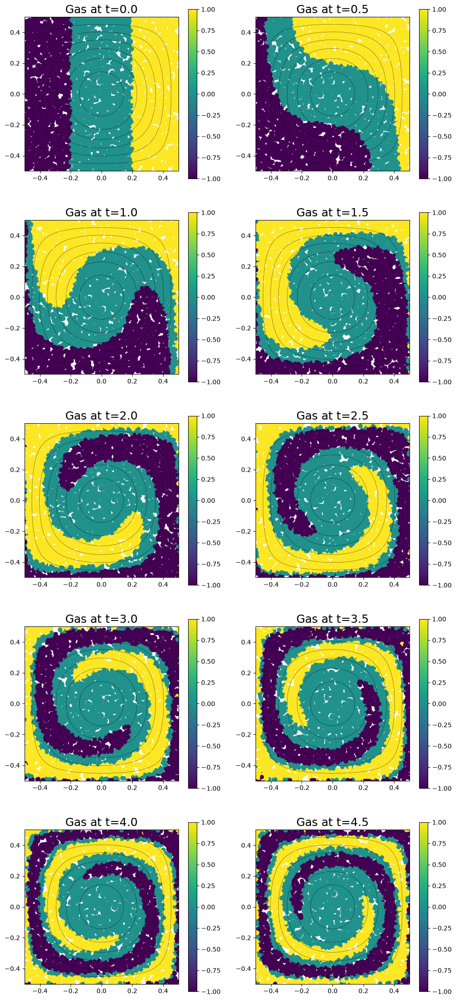

In [13]:
from matplotlib import pyplot as plt
import numpy as np

# --- ADD: Define the streamfunction (same as in the original code)
def psi(x):
    """Streamfunction psi(x,y) = cos(pi*x)*cos(pi*y)"""
    return np.cos(np.pi * x[0]) * np.cos(np.pi * x[1])

# --- ADD: Create a fine grid for contouring using your axis limits
Sg = np.linspace(l1, r1, 200)   # x-coordinates (make sure l1, r1 are defined)
Tg = np.linspace(l2, r2, 200)   # y-coordinates (make sure l2, r2 are defined)
Xg, Yg = np.meshgrid(Sg, Tg)
psi_vals = psi([Xg, Yg])

# --- Your original plotting loop (now with contours)
plt.figure(figsize=(12, 28))

orbits = sim.orbits.cold_fluid

coloring = np.select(
    [orbits[0, :, 0] <= -0.2, np.abs(orbits[0, :, 0]) < +0.2, orbits[0, :, 0] >= 0.2],
    [-1.0, 0.0, +1.0]
)

dt = time_opts.dt
Nt = sim.t_grid.size - 1
interval = Nt / 20
plot_ct = 0

for i in range(Nt):
    if i % interval == 0:
        print(f"{i=}")
        plot_ct += 1
        plt.subplot(5, 2, plot_ct)
        ax = plt.gca()

        # --- ADD: Draw streamlines (contours) in the background
        ax.contour(Xg, Yg, psi_vals, colors='k', linewidths=0.5, alpha=0.6)

        # --- Your original scatter plot
        plt.scatter(orbits[i, :, 0], orbits[i, :, 1], c=coloring)
        plt.axis("square")
        plt.title("n0_scatter")          # will be overwritten
        plt.xlim(l1, r1)
        plt.ylim(l2, r2)
        plt.colorbar()
        plt.title(f"Gas at t={i * dt}", fontsize = 18)  # final title

    if plot_ct == 10:
        break

plt.savefig("beltrami.png")

i=0
i=125
i=250
i=375


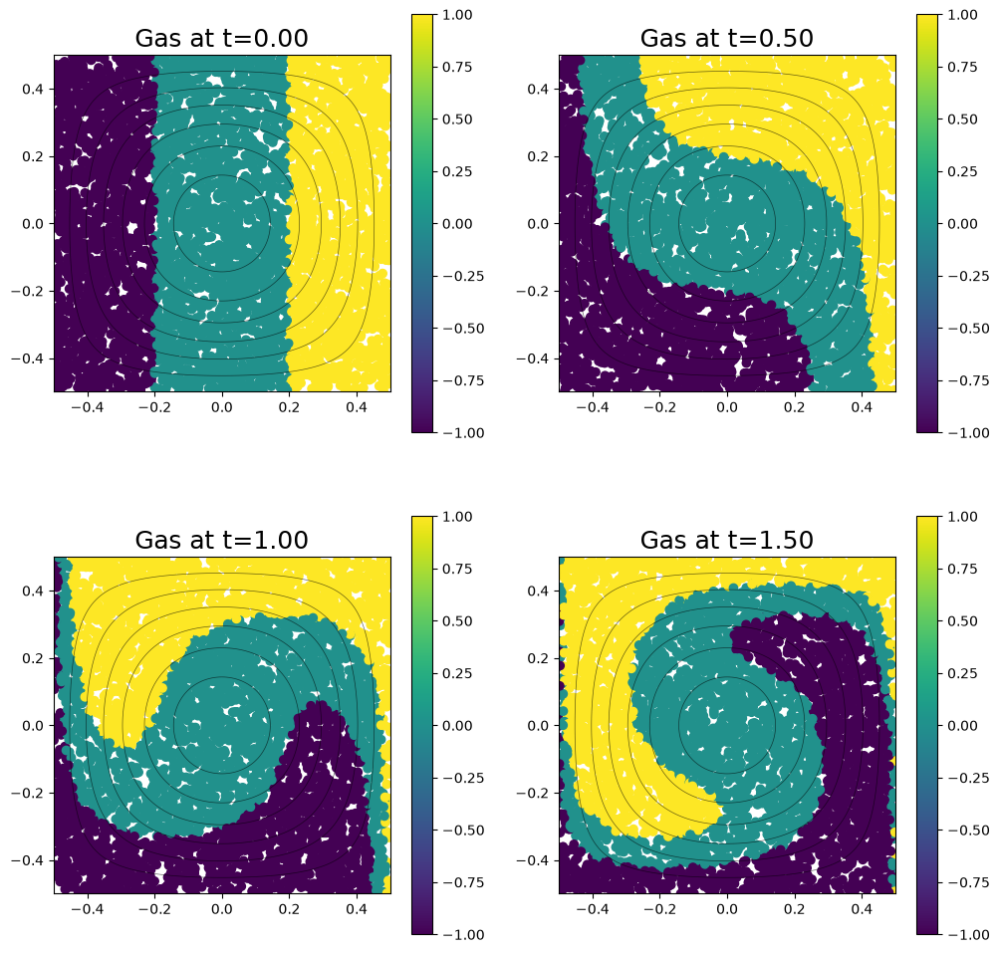

In [14]:
from matplotlib import pyplot as plt
import numpy as np

# --- Define the streamfunction
def psi(x):
    """Streamfunction psi(x,y) = cos(pi*x)*cos(pi*y)"""
    return np.cos(np.pi * x[0]) * np.cos(np.pi * x[1])

# --- Create a fine grid for contouring using your axis limits
# (Ensure l1, r1, l2, r2 are defined; e.g., from your simulation)
Sg = np.linspace(l1, r1, 200)
Tg = np.linspace(l2, r2, 200)
Xg, Yg = np.meshgrid(Sg, Tg)
psi_vals = psi([Xg, Yg])

# --- Set up the figure for a 2×2 layout
plt.figure(figsize=(12, 12))   # square figure

# --- Load particle data
orbits = sim.orbits.cold_fluid   # use 'sim' as in your original

# --- Colour particles based on initial x-position (as in original)
coloring = np.select(
    [orbits[0, :, 0] <= -0.2, np.abs(orbits[0, :, 0]) < +0.2, orbits[0, :, 0] >= 0.2],
    [-1.0, 0.0, +1.0]
)

dt = time_opts.dt
Nt = sim.t_grid.size - 1
interval = Nt / 20   # step to get roughly 20 frames; we'll only take first 4
plot_ct = 0

# --- Loop and plot only the first 4 frames
for i in range(Nt):
    if i % interval == 0:
        print(f"{i=}")
        plot_ct += 1
        plt.subplot(2, 2, plot_ct)   # 2 rows, 2 columns
        ax = plt.gca()

        # Draw streamlines in the background
        ax.contour(Xg, Yg, psi_vals, colors='k', linewidths=0.5, alpha=0.6)

        # Scatter the particles
        plt.scatter(orbits[i, :, 0], orbits[i, :, 1], c=coloring)
        plt.axis("square")
        plt.xlim(l1, r1)
        plt.ylim(l2, r2)
        plt.colorbar()
        plt.title(f"Gas at t={i * dt:.2f}", fontsize=18)   # show time with 2 decimals

    if plot_ct == 4:   # stop after 4 subplots
        break

# --- Save the figure
plt.savefig("beltrami.png", bbox_inches='tight')

### Step 9: Repeat with Structured Marker Loading

To compare loading strategies, run a second simulation in a separate folder (`sim_2`) so outputs stay isolated from the first run.

In [15]:
# light-weight model instance
model = PressureLessSPH(epsilon=1.0)

# environment options
env = EnvironmentOptions(sim_folder="sim_2")

# simulation instance
sim_tess = sim.spawn_sister(model=model, env=env)

This time, use tessellation-based loading so markers start on a regular grid-like pattern. This gives a useful contrast to random loading when you inspect the trajectory plots.

In [16]:
loading_params = LoadingParameters(ppb=4, loading="tesselation")
weights_params = WeightsParameters()
boundary_params = BoundaryParameters(bc=("reflect", "reflect", "periodic"))
sorting_params = SortingParameters(boxes_per_dim=(16, 16, 1))
saving_params = SavingParameters(n_markers=1.0)

model.cold_fluid.set_markers(
    loading_params=loading_params, 
    weights_params=weights_params, 
    boundary_params=boundary_params, 
    sorting_params=sorting_params,
    saving_params=saving_params,
    bufsize=0.5
)

In [17]:
# propagator options
from struphy import ButcherTableau

butcher = ButcherTableau(algo="forward_euler")
model.propagators.push_eta.options = model.propagators.push_eta.Options(butcher=butcher)

phi = bel_flow.p0
model.propagators.push_v.phi = phi

In [18]:
# background, perturbations and initial conditions
model.cold_fluid.var.add_background(bel_flow)

In [19]:
sim_tess.run()


Starting run for model PressureLessSPH ...
Time stepping: 100%|██████████| 2500/2500 [00:16<00:00, 154.80step/s]
Struphy run finished.


In [20]:
sim_tess.pproc()


Post-processing path /home/rasaadmin/git_repos/struphy/tutorials/sim_2

No feec fields found in hdf5 file, skipping post-processing of fields.
Evaluation of 1024 marker orbits for cold_fluid
100%|██████████| 2501/2501 [00:10<00:00, 240.19it/s]


In [21]:
sim_tess.load_plotting_data()


Loading post-processed plotting data:
Data path: /home/rasaadmin/git_repos/struphy/tutorials/sim_2/post_processing

The following data has been loaded:

grids:
self.t_grid.shape =(2501,)

self.spline_values:

self.orbits:
    cold_fluid, shape = (2501, 1024, 8)
        Number of time points: 2501
        Number of particles:   1024
        Number of attributes:  8

self.f:

self.n_sph:



i=0
i=125
i=250
i=375
i=500
i=625
i=750
i=875
i=1000
i=1125


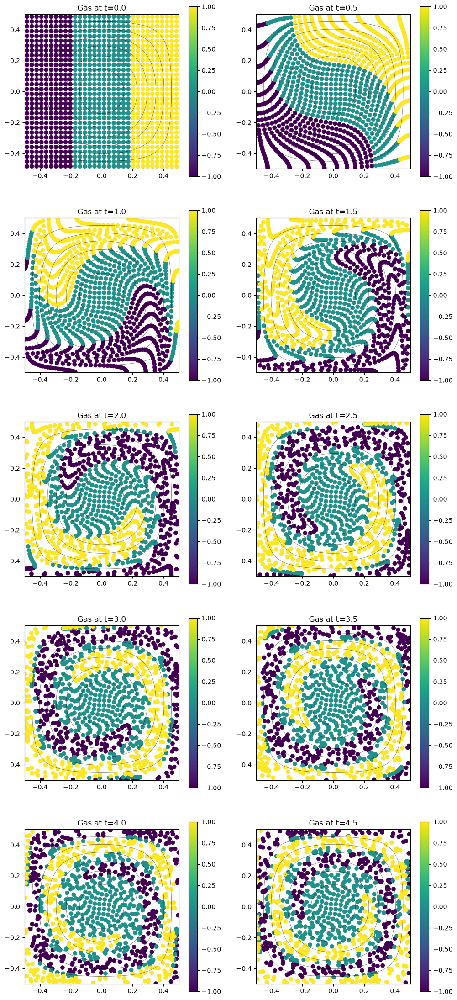

In [22]:
from matplotlib import pyplot as plt
import numpy as np

# --- ADD: Define the streamfunction (same as before)
def psi(x):
    """Streamfunction psi(x,y) = cos(pi*x)*cos(pi*y)"""
    return np.cos(np.pi * x[0]) * np.cos(np.pi * x[1])

# --- ADD: Create a fine grid for the contours using your axis limits
Sg = np.linspace(l1, r1, 200)   # x-coordinates
Tg = np.linspace(l2, r2, 200)   # y-coordinates
Xg, Yg = np.meshgrid(Sg, Tg)
psi_vals = psi([Xg, Yg])

# --- Your original plotting loop (now with contours)
plt.figure(figsize=(12, 28))

orbits = sim_tess.orbits.cold_fluid

coloring = np.select(
    [orbits[0, :, 0] <= -0.2, np.abs(orbits[0, :, 0]) < +0.2, orbits[0, :, 0] >= 0.2],
    [-1.0, 0.0, +1.0]
)

dt = time_opts.dt
Nt = sim_tess.t_grid.size - 1
interval = Nt / 20
plot_ct = 0

for i in range(Nt):
    if i % interval == 0:
        print(f"{i=}")
        plot_ct += 1
        plt.subplot(5, 2, plot_ct)
        ax = plt.gca()

        # --- ADD: Draw streamlines in the background
        ax.contour(Xg, Yg, psi_vals, colors='k', linewidths=0.5, alpha=0.6)

        # --- Your original scatter plot
        plt.scatter(orbits[i, :, 0], orbits[i, :, 1], c=coloring)
        plt.axis("square")
        plt.title("n0_scatter")          # overwritten by the next title
        plt.xlim(l1, r1)
        plt.ylim(l2, r2)
        plt.colorbar()
        plt.title(f"Gas at t={i * dt}")  # final title

    if plot_ct == 10:
        break

plt.savefig("beltrami.png")

i=0
i=125
i=250
i=375
i=500
i=625
i=750
i=875
i=1000
i=1125


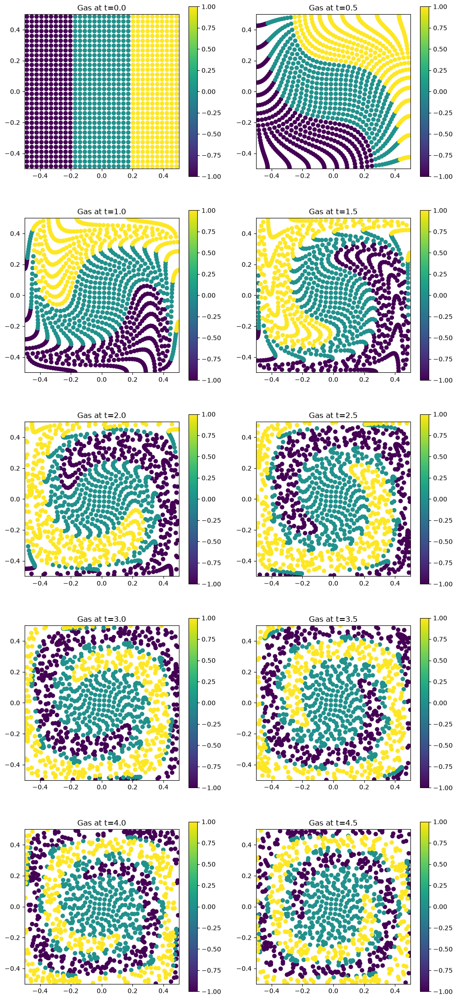

In [23]:
from matplotlib import pyplot as plt

plt.figure(figsize=(12, 28))

orbits = sim_tess.orbits.cold_fluid

coloring = np.select(
    [orbits[0, :, 0] <= -0.2, np.abs(orbits[0, :, 0]) < +0.2, orbits[0, :, 0] >= 0.2], [-1.0, 0.0, +1.0]
)

dt = time_opts.dt
Nt = sim_tess.t_grid.size - 1
interval = Nt / 20
plot_ct = 0
for i in range(Nt):
    if i % interval == 0:
        print(f"{i=}")
        plot_ct += 1
        plt.subplot(5, 2, plot_ct)
        ax = plt.gca()
        plt.scatter(orbits[i, :, 0], orbits[i, :, 1], c=coloring)
        plt.axis("square")
        plt.title("n0_scatter")
        plt.xlim(l1, r1)
        plt.ylim(l2, r2)
        plt.colorbar()
        plt.title(f"Gas at t={i * dt}")
    if plot_ct == 10:
        break

Requested t=0.0, using t=0.0, i=0
Requested t=1.0, using t=1.0, i=250
Requested t=2.0, using t=2.0, i=500
Requested t=3.0, using t=3.0, i=750


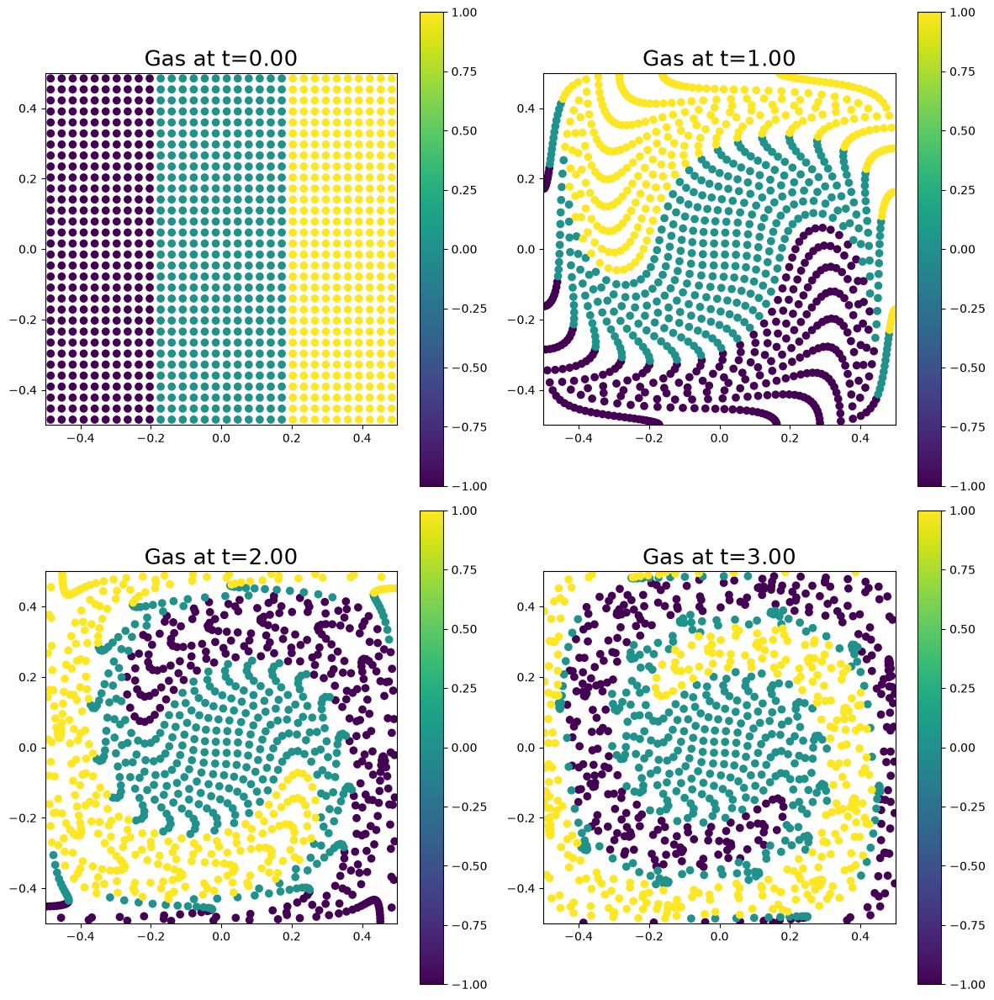

In [24]:
from matplotlib import pyplot as plt
import numpy as np

plt.figure(figsize=(12, 12))

orbits = sim_tess.orbits.cold_fluid

coloring = np.select(
    [
        orbits[0, :, 0] <= -0.2,
        np.abs(orbits[0, :, 0]) < 0.2,
        orbits[0, :, 0] >= 0.2,
    ],
    [-1.0, 0.0, +1.0]
)

dt = time_opts.dt

# Desired physical times
plot_times = [0.0, 1.0, 2.0, 3.0]

for plot_ct, t in enumerate(plot_times, start=1):

    # Find the simulation index closest to the desired time
    i = np.argmin(np.abs(sim_tess.t_grid - t))

    print(f"Requested t={t}, using t={sim_tess.t_grid[i]}, i={i}")

    ax = plt.subplot(2, 2, plot_ct)

    sc = ax.scatter(
        orbits[i, :, 0],
        orbits[i, :, 1],
        c=coloring
    )

    ax.set_aspect("equal")
    ax.set_xlim(l1, r1)
    ax.set_ylim(l2, r2)
    ax.set_title(f"Gas at t={sim_tess.t_grid[i]:.2f}", fontsize =19)

    plt.colorbar(sc, ax=ax)

plt.tight_layout()
plt.show()

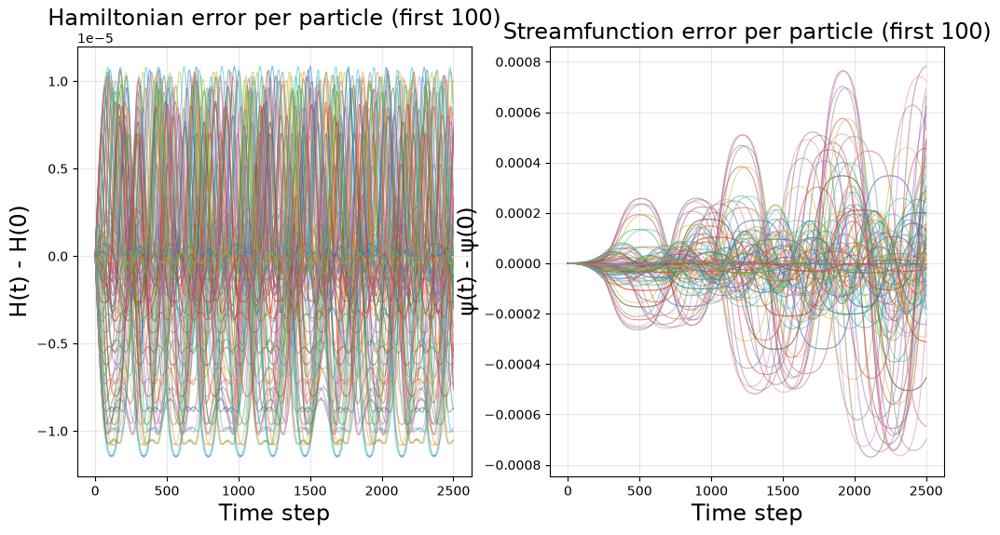

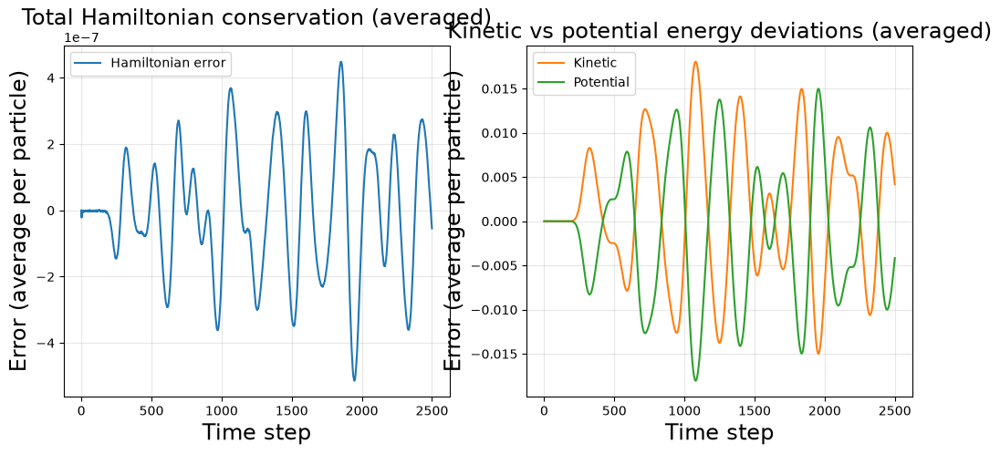

In [25]:
# ==========================================================
# DIAGNOSTICS for sim_tess: energy and invariant conservation
# ==========================================================

# --- Define the required functions (same as before)
def p(x):
    """Pressure"""
    return 0.5 * (np.sin(np.pi * x[0])**2 + np.sin(np.pi * x[1])**2)

def k(v):
    """Kinetic energy"""
    return 0.5 * (v[0]**2 + v[1]**2)

def h(x, v):
    """Hamiltonian = kinetic + potential"""
    return k(v) + p(x)

def f(x):
    """Streamfunction (invariant)"""
    return np.cos(np.pi * x[0]) * np.cos(np.pi * x[1])

# --- Use the same orbits as in your plotting loop
orbits = sim_tess.orbits.cold_fluid   # shape (Nt, N_particles, 8)

Nt = orbits.shape[0]
N_particles = orbits.shape[1]

# --- Pre-allocate arrays for total (averaged) energies
tot_Ham = np.zeros(Nt)
tot_Kin = np.zeros(Nt)
tot_Ein = np.zeros(Nt)

# --- Figure for individual particle errors (first 100)
fig_h = plt.figure(figsize=(12, 6))
ax_h1 = fig_h.add_subplot(121)
ax_h2 = fig_h.add_subplot(122)

# --- Loop over all particles to accumulate totals and plot first 100
for ip in range(N_particles):
    # Extract position (x, y) and velocity (vx, vy) for this particle over time
    x_t = np.array([orbits[:, ip, 0], orbits[:, ip, 1]])   # shape (2, Nt)
    v_t = np.array([orbits[:, ip, 3], orbits[:, ip, 4]])   # shape (2, Nt)

    # Compute per-particle quantities
    particle_h = h(x_t, v_t)
    particle_k = k(v_t)
    particle_p = p(x_t)
    particle_f = f(x_t)

    # Accumulate for averaging later
    tot_Ham += particle_h
    tot_Kin += particle_k
    tot_Ein += particle_p

    # Plot deviations for the first 100 particles
    if ip < 100:
        ax_h1.plot(particle_h - particle_h[0], alpha=0.5, linewidth=0.8)
        ax_h2.plot(particle_f - particle_f[0], alpha=0.5, linewidth=0.8)

# --- Add titles, labels, and grid to the first figure
ax_h1.set_xlabel('Time step', fontsize= 17)
ax_h1.set_ylabel('H(t) - H(0)', fontsize = 17)
ax_h1.set_title('Hamiltonian error per particle (first 100)', fontsize = 17)
ax_h1.grid(True, alpha=0.3)

ax_h2.set_xlabel('Time step', fontsize = 17)
ax_h2.set_ylabel('ψ(t) - ψ(0)', fontsize= 17)
ax_h2.set_title('Streamfunction error per particle (first 100)', fontsize = 17)
ax_h2.grid(True, alpha=0.3)

# --- Normalize totals by number of particles (average per particle)
tot_Ham /= N_particles
tot_Kin /= N_particles
tot_Ein /= N_particles

# --- Figure for total (ensemble‑averaged) energy conservation
fig_tot = plt.figure(figsize=(12, 5))
ax_t1 = fig_tot.add_subplot(121)
ax_t2 = fig_tot.add_subplot(122)

ax_t1.plot(tot_Ham - tot_Ham[0], label='Hamiltonian error', color='C0')
ax_t1.set_xlabel('Time step',fontsize = 17)
ax_t1.set_ylabel('Error (average per particle)', fontsize = 17)
ax_t1.legend()
ax_t1.set_title('Total Hamiltonian conservation (averaged)', fontsize = 17)
ax_t1.grid(True, alpha=0.3)

ax_t2.plot(tot_Kin - tot_Kin[0], label='Kinetic', color='C1')
ax_t2.plot(tot_Ein - tot_Ein[0], label='Potential', color='C2')
ax_t2.set_xlabel('Time step', fontsize = 17)
ax_t2.set_ylabel('Error (average per particle)', fontsize = 17)
ax_t2.legend()
ax_t2.set_title('Kinetic vs potential energy deviations (averaged)', fontsize = 17)
ax_t2.grid(True, alpha=0.3)

# --- (Optional) Save the diagnostic figures
# fig_h.savefig('diagnostics_individual_tess.png', dpi=150, bbox_inches='tight')
# fig_tot.savefig('diagnostics_total_tess.png', dpi=150, bbox_inches='tight')

# --- Show all figures (this will display both diagnostics and your scatter plot)
plt.show()

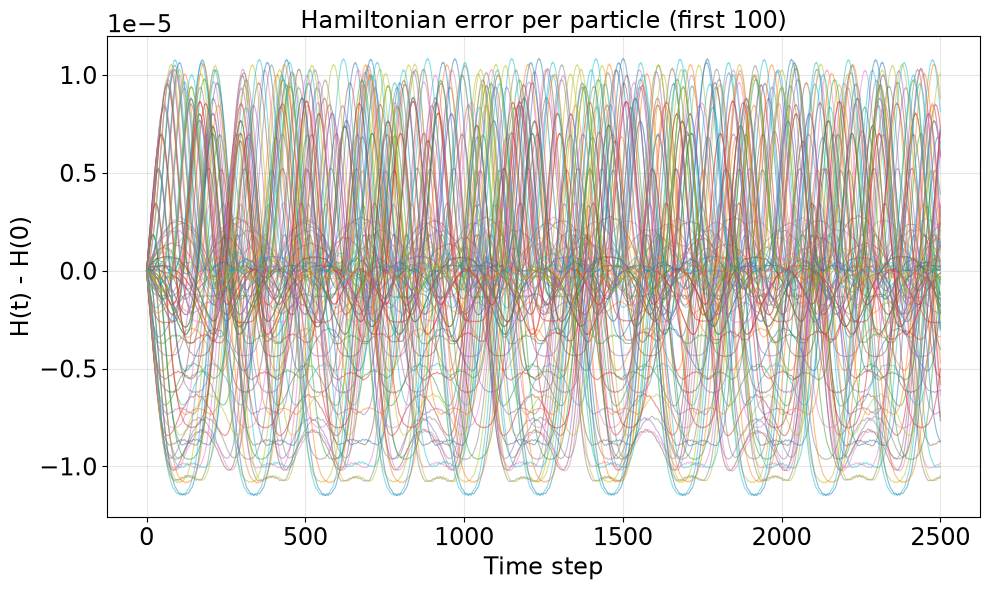

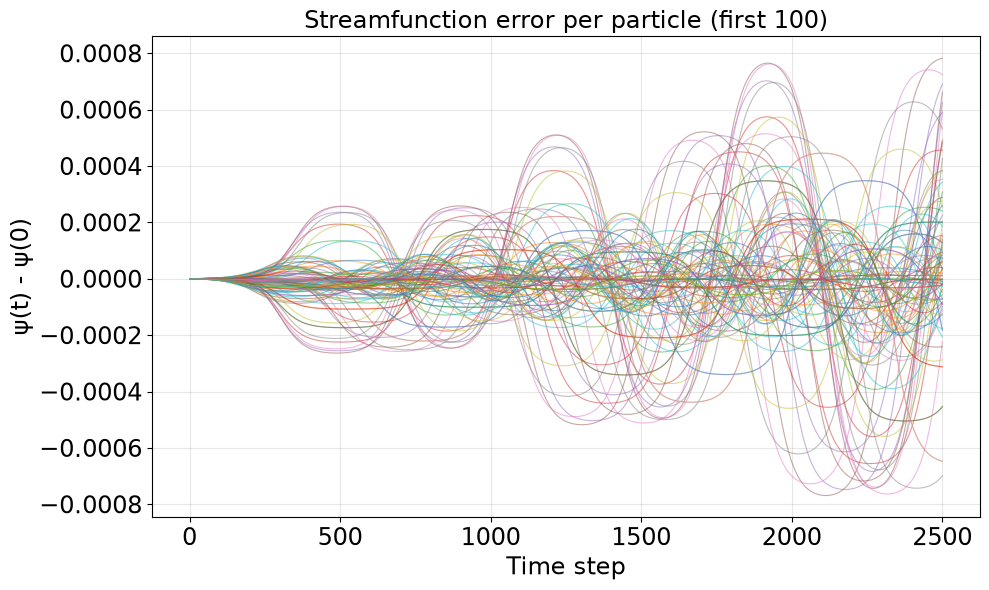

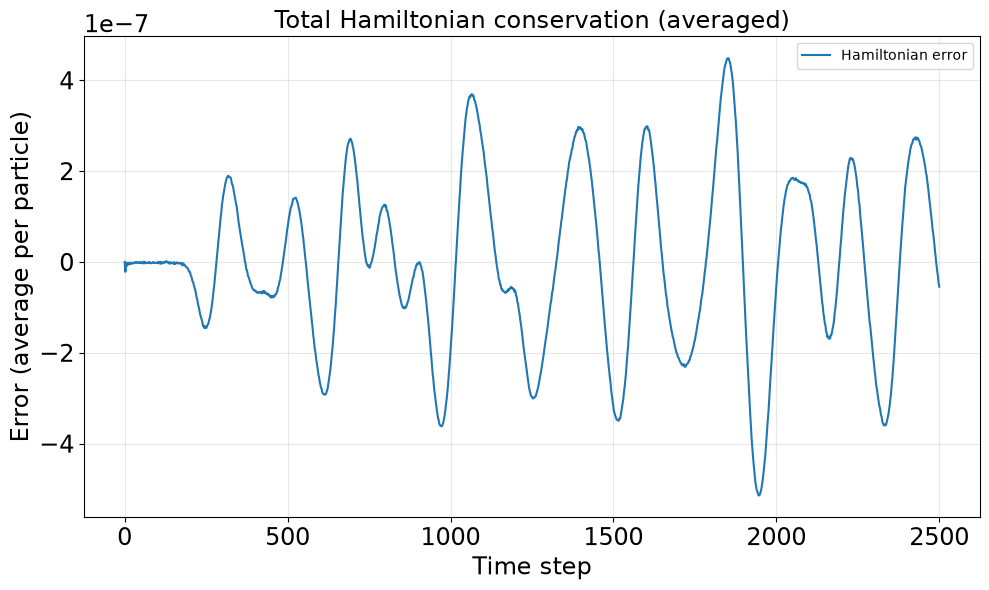

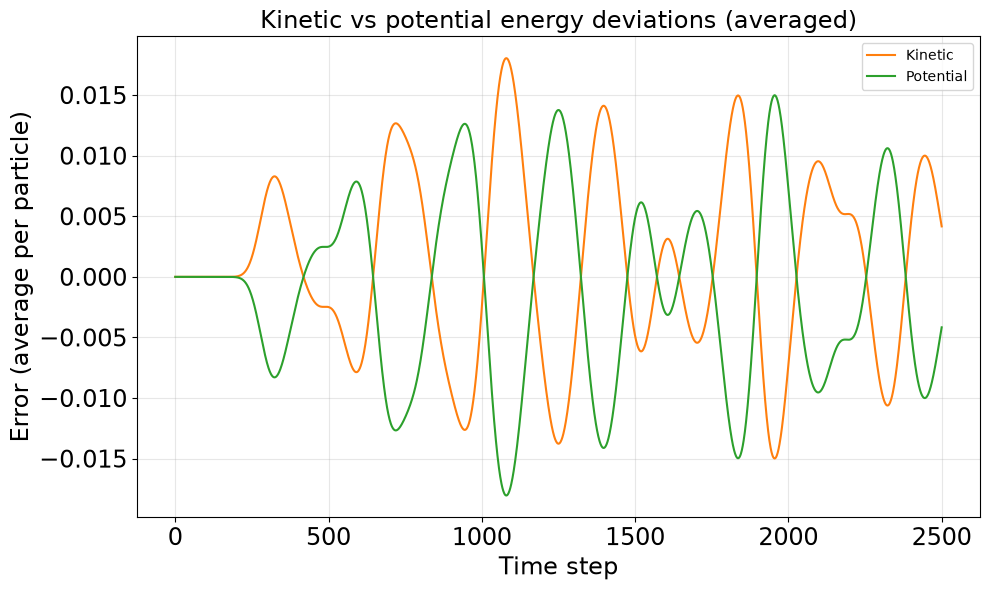

In [26]:
# ==========================================================
# DIAGNOSTICS for sim_tess: energy and invariant conservation
# ==========================================================

# --- Define the required functions (same as before)
def p(x):
    """Pressure"""
    return 0.5 * (np.sin(np.pi * x[0])**2 + np.sin(np.pi * x[1])**2)

def k(v):
    """Kinetic energy"""
    return 0.5 * (v[0]**2 + v[1]**2)

def h(x, v):
    """Hamiltonian = kinetic + potential"""
    return k(v) + p(x)

def f(x):
    """Streamfunction (invariant)"""
    return np.cos(np.pi * x[0]) * np.cos(np.pi * x[1])

# --- Use the same orbits as in your plotting loop
orbits = sim_tess.orbits.cold_fluid   # shape (Nt, N_particles, 8)

Nt = orbits.shape[0]
N_particles = orbits.shape[1]

# --- Pre-allocate arrays for total (averaged) energies
tot_Ham = np.zeros(Nt)
tot_Kin = np.zeros(Nt)
tot_Ein = np.zeros(Nt)

# --- Figure 1: Hamiltonian error per particle (first 100)
fig1 = plt.figure(figsize=(10, 6))
ax1 = fig1.add_subplot(111)
# --- Figure 2: Streamfunction error per particle (first 100)
fig2 = plt.figure(figsize=(10, 6))
ax2 = fig2.add_subplot(111)

# --- Loop over all particles to accumulate totals and plot first 100
for ip in range(N_particles):
    # Extract position (x, y) and velocity (vx, vy) for this particle over time
    x_t = np.array([orbits[:, ip, 0], orbits[:, ip, 1]])   # shape (2, Nt)
    v_t = np.array([orbits[:, ip, 3], orbits[:, ip, 4]])   # shape (2, Nt)

    # Compute per-particle quantities
    particle_h = h(x_t, v_t)
    particle_k = k(v_t)
    particle_p = p(x_t)
    particle_f = f(x_t)

    # Accumulate for averaging later
    tot_Ham += particle_h
    tot_Kin += particle_k
    tot_Ein += particle_p

    # Plot deviations for the first 100 particles
    if ip < 100:
        ax1.plot(particle_h - particle_h[0], alpha=0.5, linewidth=0.8)
        ax2.plot(particle_f - particle_f[0], alpha=0.5, linewidth=0.8)

# --- Style Figure 1
ax1.set_xlabel('Time step', fontsize=17)
ax1.set_ylabel('H(t) - H(0)', fontsize=17)
ax1.set_title('Hamiltonian error per particle (first 100)', fontsize=17)
ax1.grid(True, alpha=0.3)
ax1.tick_params(axis='both', labelsize=17) 
ax1.yaxis.offsetText.set_fontsize(17)
ax1.xaxis.offsetText.set_fontsize(17)
fig1.tight_layout()

# --- Style Figure 2
ax2.set_xlabel('Time step', fontsize=17)
ax2.set_ylabel('ψ(t) - ψ(0)', fontsize=17)
ax2.set_title('Streamfunction error per particle (first 100)', fontsize=17)
ax2.grid(True, alpha=0.3)
ax2.tick_params(axis='both', labelsize=17) 
ax2.yaxis.offsetText.set_fontsize(17)
ax2.xaxis.offsetText.set_fontsize(17)
fig2.tight_layout()

# --- Normalize totals by number of particles (average per particle)
tot_Ham /= N_particles
tot_Kin /= N_particles
tot_Ein /= N_particles

# --- Figure 3: Total Hamiltonian conservation (averaged)
fig3 = plt.figure(figsize=(10, 6))
ax3 = fig3.add_subplot(111)
ax3.plot(tot_Ham - tot_Ham[0], label='Hamiltonian error', color='C0')
ax3.set_xlabel('Time step', fontsize=17)
ax3.set_ylabel('Error (average per particle)', fontsize=17)
ax3.legend()
ax3.set_title('Total Hamiltonian conservation (averaged)', fontsize=17)
ax3.grid(True, alpha=0.3)
ax3.tick_params(axis='both', labelsize=17) 
ax3.yaxis.offsetText.set_fontsize(17)
ax3.xaxis.offsetText.set_fontsize(17)
fig3.tight_layout()

# --- Figure 4: Kinetic vs potential energy deviations (averaged)
fig4 = plt.figure(figsize=(10, 6))
ax4 = fig4.add_subplot(111)
ax4.plot(tot_Kin - tot_Kin[0], label='Kinetic', color='C1')
ax4.plot(tot_Ein - tot_Ein[0], label='Potential', color='C2')
ax4.set_xlabel('Time step', fontsize=17)
ax4.set_ylabel('Error (average per particle)', fontsize=17)
ax4.legend()
ax4.set_title('Kinetic vs potential energy deviations (averaged)', fontsize=17)
ax4.grid(True, alpha=0.3)
ax4.tick_params(axis='both', labelsize=17) 
ax4.yaxis.offsetText.set_fontsize(17)
ax4.xaxis.offsetText.set_fontsize(17)
fig4.tight_layout()

# --- (Optional) Save each figure individually
# fig1.savefig('hamiltonian_error_per_particle.png', dpi=150, bbox_inches='tight')
# fig2.savefig('streamfunction_error_per_particle.png', dpi=150, bbox_inches='tight')
# fig3.savefig('total_hamiltonian_error.png', dpi=150, bbox_inches='tight')
# fig4.savefig('kinetic_potential_deviations.png', dpi=150, bbox_inches='tight')

# --- Show all four figures
plt.show()